In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
os.environ['KAGGLE_CONFIG_DIR'] = "/content/drive/MyDrive/Kaggle"

In [ ]:
import torch
from IPython.display import Image, clear_output   

#clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 1.9.0+cu102 _CudaDeviceProperties(name='Tesla P100-PCIE-16GB', major=6, minor=0, total_memory=16280MB, multi_processor_count=56)


In [ ]:
#changing the working directory
%cd /content/drive/MyDrive/Kaggle/Tomato

/content/drive/MyDrive/Kaggle/Tomato


In [ ]:
%cd ./yolov5/

/content/drive/My Drive/Kaggle/Tomato/yolov5


In [ ]:
# !kaggle datasets download -d andrewmvd/tomato-detection

 98% 177M/180M [00:02<00:00, 56.2MB/s]
100% 180M/180M [00:02<00:00, 84.6MB/s]


In [ ]:
# #unzipping the zip files and deleting the zip files
# !unzip \*.zip  && rm *.zip

In [ ]:
# Tesla p100 is the fastest gpu available and then Tesla T4 
!nvidia-smi

Mon Jul 12 09:57:31 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.42.01    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   39C    P0    23W / 300W |      2MiB / 16160MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
!git clone https://github.com/ultralytics/yolov5 

fatal: destination path 'yolov5' already exists and is not an empty directory.


In [ ]:
!pip install -r yolov5/requirements.txt
# clear_output()

In [ ]:
# # For split data

# pip install split-folders
# input_folder = '/content/drive/MyDrive/Kaggle/Tomato/Data/AllData/'
# import splitfolders
# splitfolders.ratio(input_folder, output = '/content/drive/MyDrive/Kaggle/Tomato/Data/TomatoData',
#                    ratio = (.7, .2, .1),
#                    group_prefix = None)

In [ ]:
%cat Data/data.yaml


train: /content/drive/MyDrive/Kaggle/Tomato/Data/train
val: /content/drive/MyDrive/Kaggle/Tomato/Data/valid
nc: 1
names: ['tomato']

In [ ]:
# define number of classes based on YAML
import yaml
with open("Data/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])
print(num_classes)

1


# Yolov5s

In [ ]:
%cat yolov5/models/yolov5s.yaml

# parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, C3, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C

In [ ]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
%%writetemplate yolov5/models/yolov5s.yaml

# parameters
nc: 1  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50 # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, C3, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [ ]:
!pip install wandb
!pip PyYAML-5.4.1
import wandb

In [ ]:
%cd yolov5/

/content/drive/MyDrive/Kaggle/Tomato/yolov5


In [ ]:
%%time
!python train.py --img 640  --batch 4 --epochs 50 --data /content/drive/MyDrive/Kaggle/Tomato/Data/data.yaml --cfg /content/drive/MyDrive/Kaggle/Tomato/yolov5/models/yolov5s.yaml --weight yolov5s.pt --name yolov5s_results

github: ⚠️ WARNING: code is out of date by 21 commits. Use 'git pull' to update or 'git clone https://github.com/ultralytics/yolov5' to download latest.
YOLOv5 🚀 2021-6-17 torch 1.9.0+cu102 CUDA:0 (Tesla T4, 15109.75MB)

Namespace(adam=False, artifact_alias='latest', batch_size=4, bbox_interval=-1, bucket='', cache_images=False, cfg='/content/drive/MyDrive/Kaggle/Tomato/yolov5/models/yolov5s.yaml', data='/content/drive/MyDrive/Kaggle/Tomato/Data/data.yaml', device='', entity=None, epochs=50, evolve=False, exist_ok=False, global_rank=-1, hyp='data/hyp.scratch.yaml', image_weights=False, img_size=[640, 640], label_smoothing=0.0, linear_lr=False, local_rank=-1, multi_scale=False, name='yolov5s_results', noautoanchor=False, nosave=False, notest=False, project='runs/train', quad=False, rect=False, resume=False, save_dir='runs/train/yolov5s_results2', save_period=-1, single_cls=False, sync_bn=False, total_batch_size=4, upload_dataset=False, weights='yolov5s.pt', workers=8, world_size=1)
hype

In [ ]:
!python test.py --weights /content/drive/MyDrive/Kaggle/Tomato/yolov5/runs/train/yolov5s_results2/weights/best.pt --data '/content/drive/MyDrive/Kaggle/Tomato/Data/data.yaml' --img 640 --augment

Namespace(augment=True, batch_size=32, conf_thres=0.001, data='/content/drive/MyDrive/Kaggle/Tomato/Data/data.yaml', device='', exist_ok=False, half=False, imgsz=640, iou_thres=0.6, name='exp', project='runs/test', save_conf=False, save_hybrid=False, save_json=False, save_txt=False, single_cls=False, task='val', verbose=False, weights=['/content/drive/MyDrive/Kaggle/Tomato/yolov5/runs/train/yolov5s_results2/weights/best.pt'])
YOLOv5 🚀 v5.0-207-g045d5d8 torch 1.9.0+cu102 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
Model Summary: 224 layers, 7053910 parameters, 0 gradients
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
val: Scanning

In [ ]:
!python detect.py --img-size 640  --conf 0.4 --source /content/drive/MyDrive/Kaggle/Tomato/Data/test/images --weights /content/drive/MyDrive/Kaggle/Tomato/yolov5/runs/train/yolov5s_results2/weights/best.pt --augment 

Namespace(agnostic_nms=False, augment=True, classes=None, conf_thres=0.4, device='', exist_ok=False, half=False, hide_conf=False, hide_labels=False, imgsz=640, iou_thres=0.45, line_thickness=3, max_det=1000, name='exp', nosave=False, project='runs/detect', save_conf=False, save_crop=False, save_txt=False, source='/content/drive/MyDrive/Kaggle/Tomato/Data/test/images', update=False, view_img=False, weights=['/content/drive/MyDrive/Kaggle/Tomato/yolov5/runs/train/yolov5s_results2/weights/best.pt'])
YOLOv5 🚀 v5.0-207-g045d5d8 torch 1.9.0+cu102 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
Model Summary: 224 layers, 7053910 parameters, 0 gradients
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d

In [ ]:
!python detect.py --img-size 640  --conf 0.4 --source /content/drive/MyDrive/Kaggle/Tomato/Tomato60fps.mp4 --weights /content/drive/MyDrive/Kaggle/Tomato/yolov5/runs/train/yolov5s_results2/weights/best.pt --augment 

usage: detect.py [-h] [--weights WEIGHTS [WEIGHTS ...]] [--source SOURCE]
                 [--imgsz IMGSZ] [--conf-thres CONF_THRES]
                 [--iou-thres IOU_THRES] [--max-det MAX_DET] [--device DEVICE]
                 [--view-img] [--save-txt] [--save-conf] [--save-crop]
                 [--nosave] [--classes CLASSES [CLASSES ...]] [--agnostic-nms]
                 [--augment] [--update] [--project PROJECT] [--name NAME]
                 [--exist-ok] [--line-thickness LINE_THICKNESS]
                 [--hide-labels] [--hide-conf] [--half]
detect.py: error: unrecognized arguments: -benchmark


In [ ]:
./darknet detector demo .\data\obj_cl.data .\yolo-obj_cl.cfg .\backup_cl\yolo-obj_cl_best.weights .\video\zatoka2.MP4 -benchmark

# Yolov5m

In [ ]:
%cat yolov5/models/yolov5m.yaml

# parameters
nc: 80  # number of classes
depth_multiple: 0.67  # model depth multiple
width_multiple: 0.75  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, C3, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C

In [ ]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
%%writetemplate yolov5/models/yolov5m.yaml

# parameters
nc: 1  # number of classes
depth_multiple: 0.67  # model depth multiple
width_multiple: 0.75  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, C3, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [ ]:
%%time
!python train.py --img 640  --batch 4 --epochs 50 --data /content/drive/MyDrive/Kaggle/Tomato/Data/data.yaml --cfg /content/drive/MyDrive/Kaggle/Tomato/yolov5/models/yolov5m.yaml --weight yolov5m.pt --name yolov5m_results

github: ⚠️ WARNING: code is out of date by 22 commits. Use 'git pull' to update or 'git clone https://github.com/ultralytics/yolov5' to download latest.
YOLOv5 🚀 2021-6-17 torch 1.9.0+cu102 CUDA:0 (Tesla T4, 15109.75MB)

Namespace(adam=False, artifact_alias='latest', batch_size=4, bbox_interval=-1, bucket='', cache_images=False, cfg='/content/drive/MyDrive/Kaggle/Tomato/yolov5/models/yolov5m.yaml', data='/content/drive/MyDrive/Kaggle/Tomato/Data/data.yaml', device='', entity=None, epochs=50, evolve=False, exist_ok=False, global_rank=-1, hyp='data/hyp.scratch.yaml', image_weights=False, img_size=[640, 640], label_smoothing=0.0, linear_lr=False, local_rank=-1, multi_scale=False, name='yolov5m_results', noautoanchor=False, nosave=False, notest=False, project='runs/train', quad=False, rect=False, resume=False, save_dir='runs/train/yolov5m_results2', save_period=-1, single_cls=False, sync_bn=False, total_batch_size=4, upload_dataset=False, weights='yolov5m.pt', workers=8, world_size=1)
hype

In [ ]:
!python test.py --weights /content/drive/MyDrive/Kaggle/Tomato/yolov5/runs/train/yolov5m_results2/weights/best.pt --data '/content/drive/MyDrive/Kaggle/Tomato/Data/data.yaml' --img 640 --augment

Namespace(augment=True, batch_size=32, conf_thres=0.001, data='/content/drive/MyDrive/Kaggle/Tomato/Data/data.yaml', device='', exist_ok=False, half=False, imgsz=640, iou_thres=0.6, name='exp', project='runs/test', save_conf=False, save_hybrid=False, save_json=False, save_txt=False, single_cls=False, task='val', verbose=False, weights=['/content/drive/MyDrive/Kaggle/Tomato/yolov5/runs/train/yolov5m_results2/weights/best.pt'])
YOLOv5 🚀 v5.0-207-g045d5d8 torch 1.9.0+cu102 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
Model Summary: 308 layers, 21037638 parameters, 0 gradients
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
val: Scannin

# Yolov5l

In [ ]:
%cat ./models/yolov5l.yaml

# parameters
nc: 80  # number of classes
depth_multiple: 1.0  # model depth multiple
width_multiple: 1.0  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, C3, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3,

In [ ]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
%%writetemplate ./models/yolov5l.yaml

# parameters
nc: 1  # number of classes
depth_multiple: 1.0  # model depth multiple
width_multiple: 1.0  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, C3, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [ ]:
%%time
!python train.py --img 640  --batch 4 --epochs 50 --data /content/drive/MyDrive/Kaggle/Tomato/Data/data.yaml --cfg /content/drive/MyDrive/Kaggle/Tomato/yolov5/models/yolov5l.yaml --weight yolov5l.pt --name yolov5l_results

remote: Enumerating objects: 6, done.
remote: Counting objects: 100% (6/6), done.
remote: Total 6 (delta 5), reused 6 (delta 5), pack-reused 0
Unpacking objects: 100% (6/6), done.
From https://github.com/ultralytics/yolov5
   c260622..eeb64dc  feature/yaml_path -> origin/feature/yaml_path
github: ⚠️ WARNING: code is out of date by 22 commits. Use 'git pull' to update or 'git clone https://github.com/ultralytics/yolov5' to download latest.
YOLOv5 🚀 2021-6-17 torch 1.9.0+cu102 CUDA:0 (Tesla T4, 15109.75MB)

Namespace(adam=False, artifact_alias='latest', batch_size=4, bbox_interval=-1, bucket='', cache_images=False, cfg='/content/drive/MyDrive/Kaggle/Tomato/yolov5/models/yolov5l.yaml', data='/content/drive/MyDrive/Kaggle/Tomato/Data/data.yaml', device='', entity=None, epochs=50, evolve=False, exist_ok=False, global_rank=-1, hyp='data/hyp.scratch.yaml', image_weights=False, img_size=[640, 640], label_smoothing=0.0, linear_lr=False, local_rank=-1, multi_scale=False, name='yolov5l_results', 

In [ ]:
!python test.py --weights /content/drive/MyDrive/Kaggle/Tomato/yolov5/runs/train/yolov5l_results/weights/best.pt --data '/content/drive/MyDrive/Kaggle/Tomato/Data/data.yaml' --img 640 --augment

Namespace(augment=True, batch_size=32, conf_thres=0.001, data='/content/drive/MyDrive/Kaggle/Tomato/Data/data.yaml', device='', exist_ok=False, half=False, imgsz=640, iou_thres=0.6, name='exp', project='runs/test', save_conf=False, save_hybrid=False, save_json=False, save_txt=False, single_cls=False, task='val', verbose=False, weights=['/content/drive/MyDrive/Kaggle/Tomato/yolov5/runs/train/yolov5l_results/weights/best.pt'])
YOLOv5 🚀 2021-6-17 torch 1.9.0+cu102 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
Model Summary: 392 layers, 46600566 parameters, 0 gradients
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
val: Scanning '/conte

In [ ]:
!kill 2110

In [ ]:
%load_ext tensorboard
%tensorboard --logdir '/content/drive/MyDrive/Kaggle/Tomato/yolov5/runs'

<IPython.core.display.Javascript object>

# Yolov5X

In [ ]:
%cat yolov5/models/yolov5x.yaml

# parameters
nc: 80  # number of classes
depth_multiple: 1.33  # model depth multiple
width_multiple: 1.25  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, C3, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C

In [ ]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
%%writetemplate /content/drive/MyDrive/Kaggle/Tomato/Data/data.yaml

train: /content/drive/MyDrive/Kaggle/Tomato/Data/train
val: /content/drive/MyDrive/Kaggle/Tomato/Data/valid
nc: 1
names: ['tomato']

In [ ]:
%%writetemplate yolov5/models/yolov5x.yaml

# parameters
nc: 1  # number of classes
depth_multiple: 1.33  # model depth multiple
width_multiple: 1.25  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, C3, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [ ]:
!pip install wandb
import wandb

In [ ]:
# You should skip this line
# !wandb off

In [ ]:
%cd yolov5

/content/drive/My Drive/Kaggle/Tomato/yolov5


In [ ]:
# for check the widdth and height of all images
# import os
# from PIL import Image 

# folder_images = "/content/drive/MyDrive/Kaggle/Tomato/Data/train/images"
# size_images = dict()

# for dirpath, _, filenames in os.walk(folder_images):
#     for path_image in filenames:
#         image = os.path.abspath(os.path.join(dirpath, path_image))
#         with Image.open(image) as img:
#             width, heigth = img.size
#             size_images[path_image] = {'width': width, 'heigth': heigth}
# print(size_images)

# size_images[max(size_images)]

{'tomato100.png': {'width': 400, 'heigth': 500}, 'tomato0.png': {'width': 400, 'heigth': 500}, 'tomato1.png': {'width': 500, 'heigth': 400}, 'tomato101.png': {'width': 500, 'heigth': 400}, 'tomato13.png': {'width': 500, 'heigth': 400}, 'tomato122.png': {'width': 500, 'heigth': 400}, 'tomato131.png': {'width': 400, 'heigth': 500}, 'tomato142.png': {'width': 400, 'heigth': 500}, 'tomato107.png': {'width': 400, 'heigth': 500}, 'tomato121.png': {'width': 400, 'heigth': 500}, 'tomato103.png': {'width': 400, 'heigth': 500}, 'tomato116.png': {'width': 500, 'heigth': 400}, 'tomato12.png': {'width': 400, 'heigth': 500}, 'tomato11.png': {'width': 500, 'heigth': 400}, 'tomato139.png': {'width': 400, 'heigth': 500}, 'tomato111.png': {'width': 500, 'heigth': 400}, 'tomato119.png': {'width': 500, 'heigth': 400}, 'tomato149.png': {'width': 400, 'heigth': 500}, 'tomato108.png': {'width': 500, 'heigth': 400}, 'tomato105.png': {'width': 400, 'heigth': 500}, 'tomato151.png': {'width': 400, 'heigth': 500}

{'heigth': 500, 'width': 400}

In [ ]:
import torch
torch.cuda.empty_cache()

In [ ]:
%%time
!python train.py --img 640  --batch 4 --epochs 50 --data /content/drive/MyDrive/Kaggle/Tomato/Data/data.yaml --cfg /content/drive/MyDrive/Kaggle/Tomato/yolov5/models/yolov5x.yaml --weight yolov5x.pt --name yolov5x_results

github: ⚠️ WARNING: code is out of date by 4 commits. Use 'git pull' to update or 'git clone https://github.com/ultralytics/yolov5' to download latest.
YOLOv5 🚀 2021-6-17 torch 1.9.0+cu102 CUDA:0 (Tesla V100-SXM2-16GB, 16160.5MB)

Namespace(adam=False, artifact_alias='latest', batch_size=4, bbox_interval=-1, bucket='', cache_images=False, cfg='/content/drive/MyDrive/Kaggle/Tomato/yolov5/models/yolov5x.yaml', data='/content/drive/MyDrive/Kaggle/Tomato/Data/data.yaml', device='', entity=None, epochs=50, evolve=False, exist_ok=False, global_rank=-1, hyp='data/hyp.scratch.yaml', image_weights=False, img_size=[640, 640], label_smoothing=0.0, linear_lr=False, local_rank=-1, multi_scale=False, name='yolov5x_results', noautoanchor=False, nosave=False, notest=False, project='runs/train', quad=False, rect=False, resume=False, save_dir='runs/train/yolov5x_results3', save_period=-1, single_cls=False, sync_bn=False, total_batch_size=4, upload_dataset=False, weights='yolov5x.pt', workers=8, world_si

In [ ]:
# %load_ext tensorboard
# %tensorboard --logdir logs

In [ ]:
# let's check the training result directory.
# Here model and result are saved
!ls -R /content/drive/MyDrive/Kaggle/Tomato/yolov5/runs/train/yolov5x_results3

/content/drive/MyDrive/Kaggle/Tomato/yolov5/runs/train/yolov5x_results3:
confusion_matrix.png				   results.txt
events.out.tfevents.1624047690.ad57bd937763.461.0  test_batch0_labels.jpg
F1_curve.png					   test_batch0_pred.jpg
hyp.yaml					   test_batch1_labels.jpg
labels_correlogram.jpg				   test_batch1_pred.jpg
labels.jpg					   test_batch2_labels.jpg
opt.yaml					   test_batch2_pred.jpg
P_curve.png					   train_batch0.jpg
PR_curve.png					   train_batch1.jpg
R_curve.png					   train_batch2.jpg
results.png					   weights

/content/drive/MyDrive/Kaggle/Tomato/yolov5/runs/train/yolov5x_results3/weights:
best.pt  last.pt


In [ ]:
# Analize the training and validation result 

# Image('/content/drive/MyDrive/Kaggle/Tomato/yolov5/runs/train/yolov5x_results3/labels_correlogram.jpg')

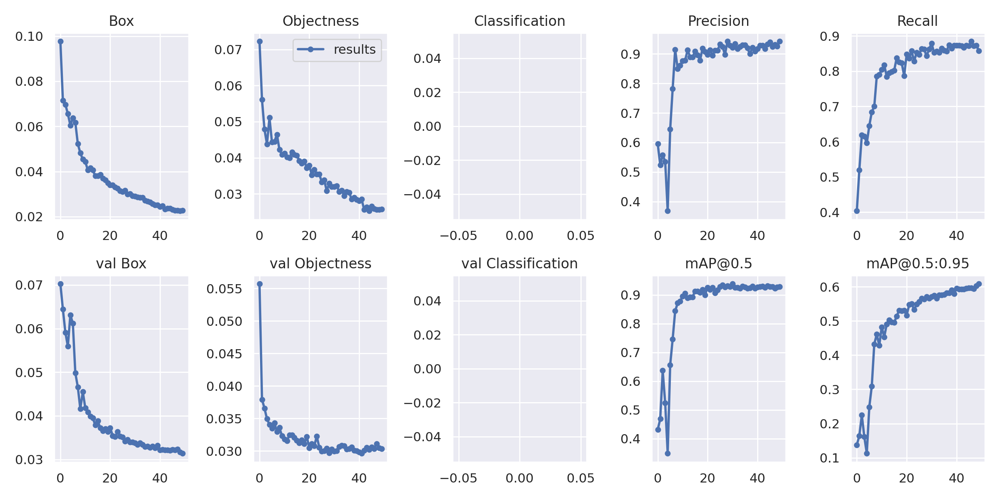

In [ ]:
# Analize the training and validation result
from IPython.display import Image
Image('/content/drive/MyDrive/Kaggle/Tomato/yolov5/runs/train/yolov5x_results3/results.png')

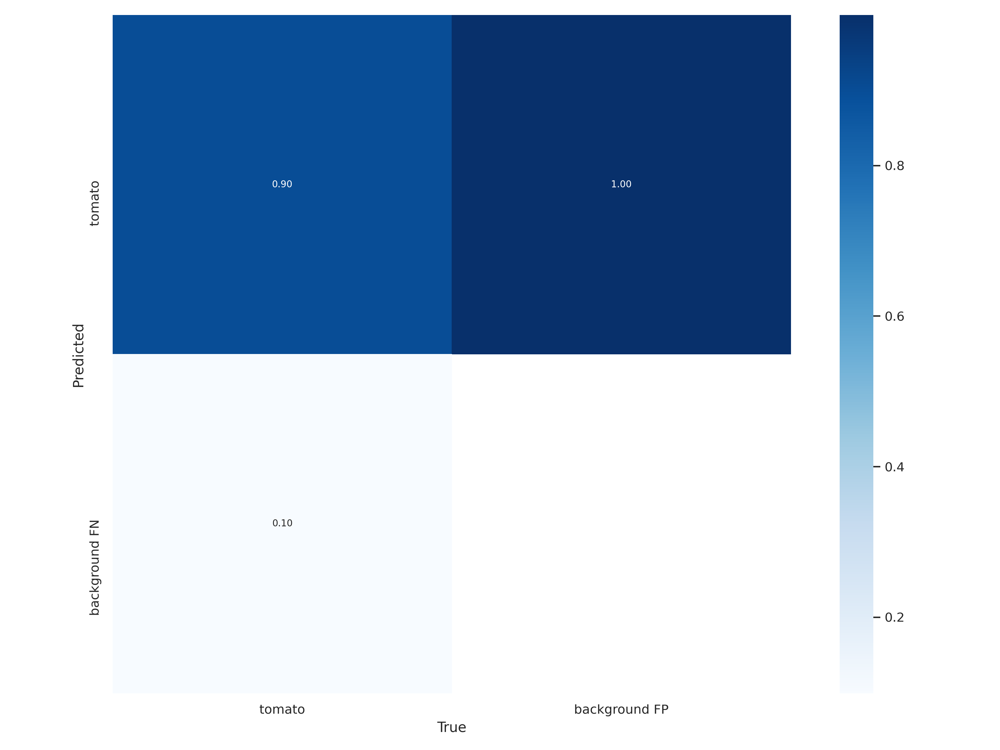

In [ ]:
# Analize the Confusion matrix
Image('/content/drive/MyDrive/Kaggle/Tomato/yolov5/runs/train/yolov5x_results3/confusion_matrix.png',width=400)

In [ ]:
!python test.py --weights /content/drive/MyDrive/Kaggle/Tomato/yolov5/runs/train/yolov5x_results3/weights/best.pt --data '/content/drive/MyDrive/Kaggle/Tomato/Data/data.yaml' --img 640 --augment

Namespace(augment=True, batch_size=32, conf_thres=0.001, data='/content/drive/MyDrive/Kaggle/Tomato/Data/data.yaml', device='', exist_ok=False, half=False, imgsz=640, iou_thres=0.6, name='exp', project='runs/test', save_conf=False, save_hybrid=False, save_json=False, save_txt=False, single_cls=False, task='val', verbose=False, weights=['/content/drive/MyDrive/Kaggle/Tomato/yolov5/runs/train/yolov5x_results3/weights/best.pt'])
YOLOv5 🚀 2021-6-17 torch 1.9.0+cu102 CUDA:0 (Tesla V100-SXM2-16GB, 16160.5MB)

Fusing layers... 
Model Summary: 476 layers, 87198694 parameters, 0 gradients
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
val: Scan

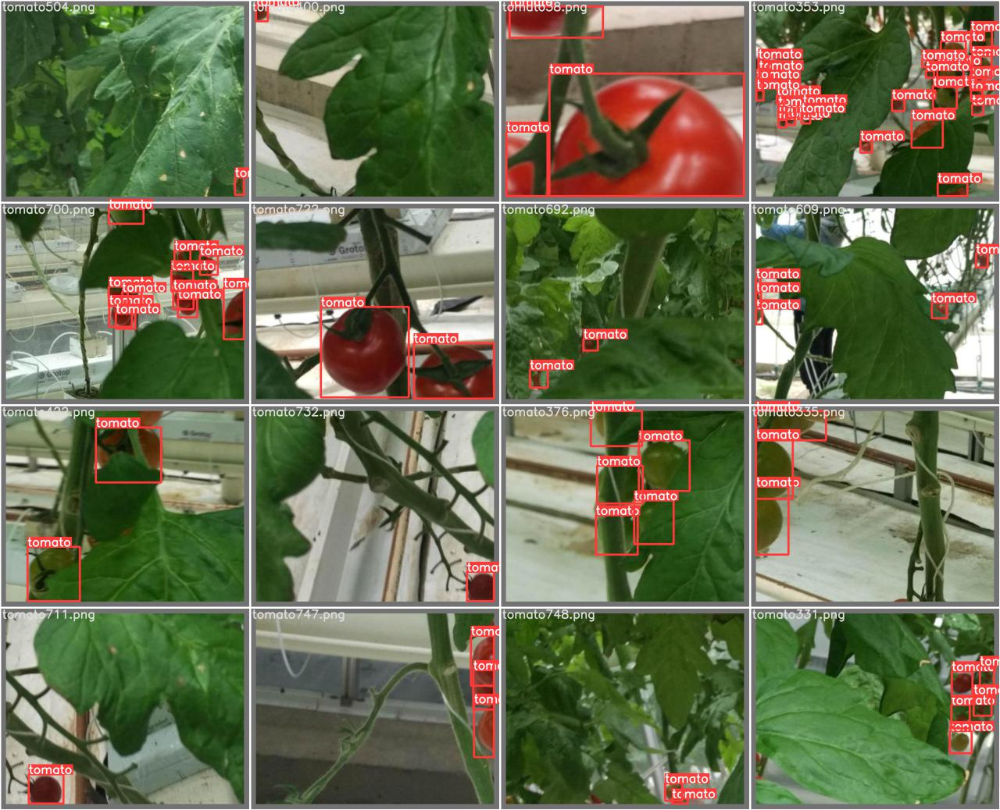

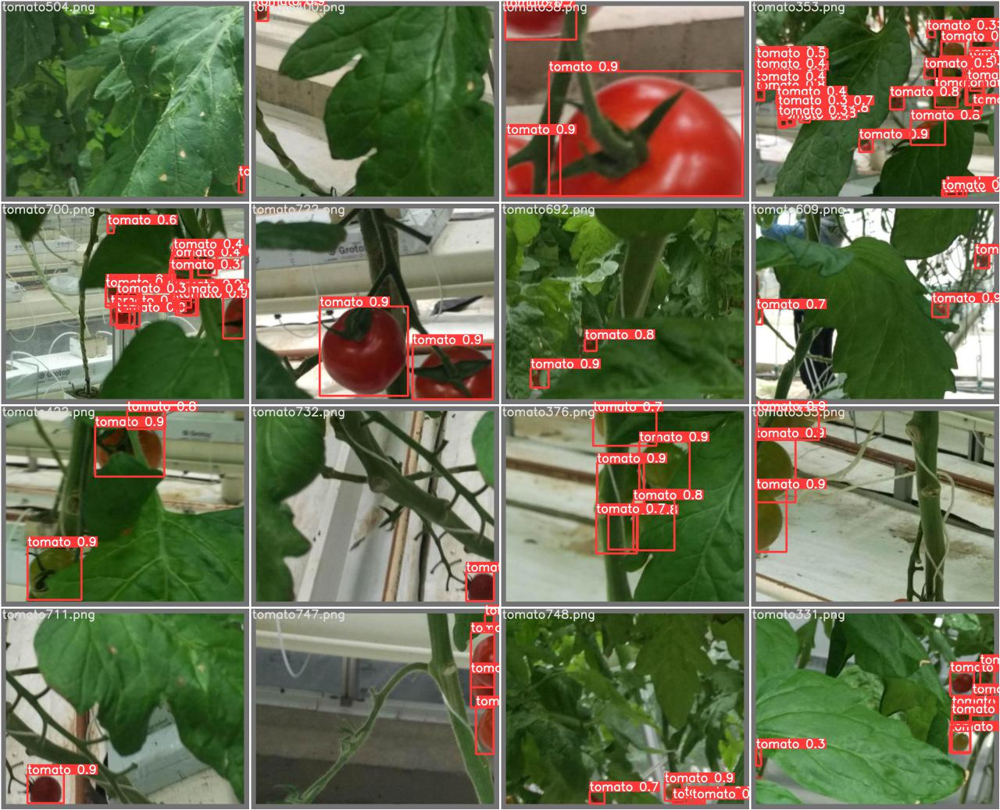

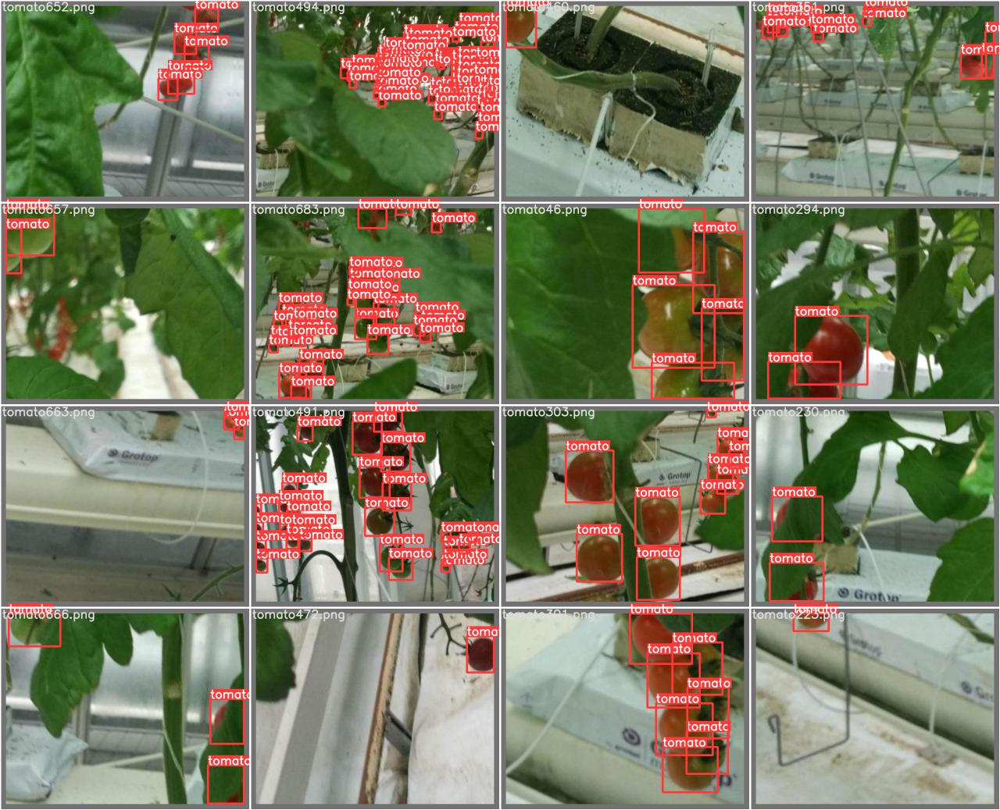

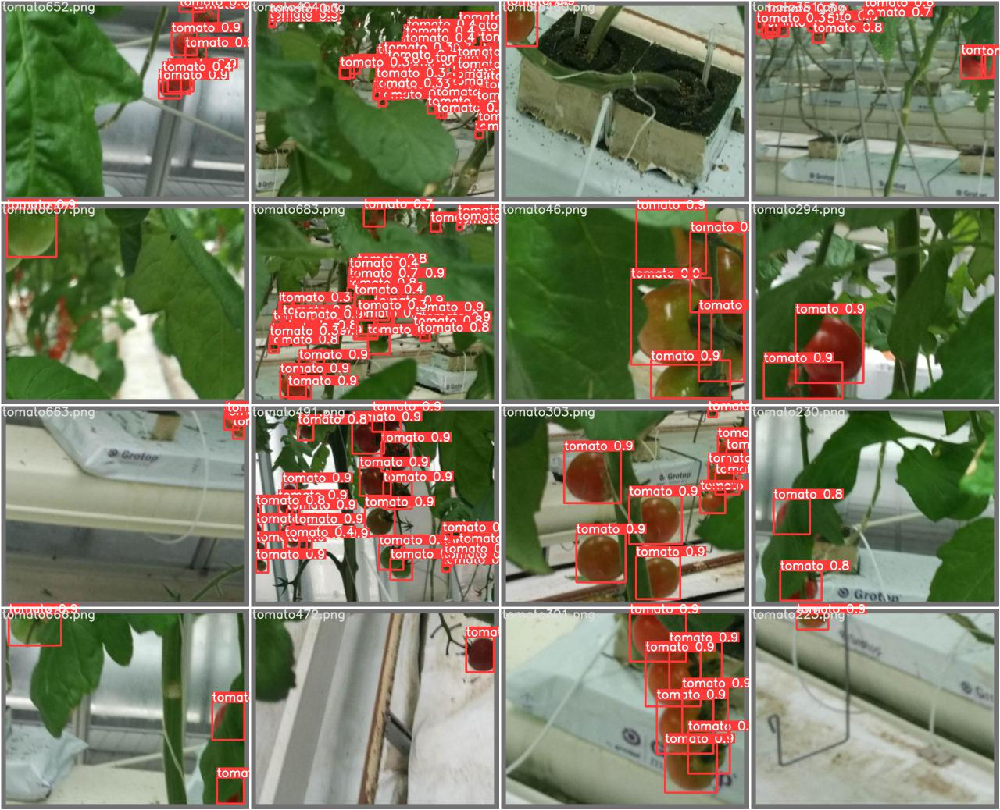

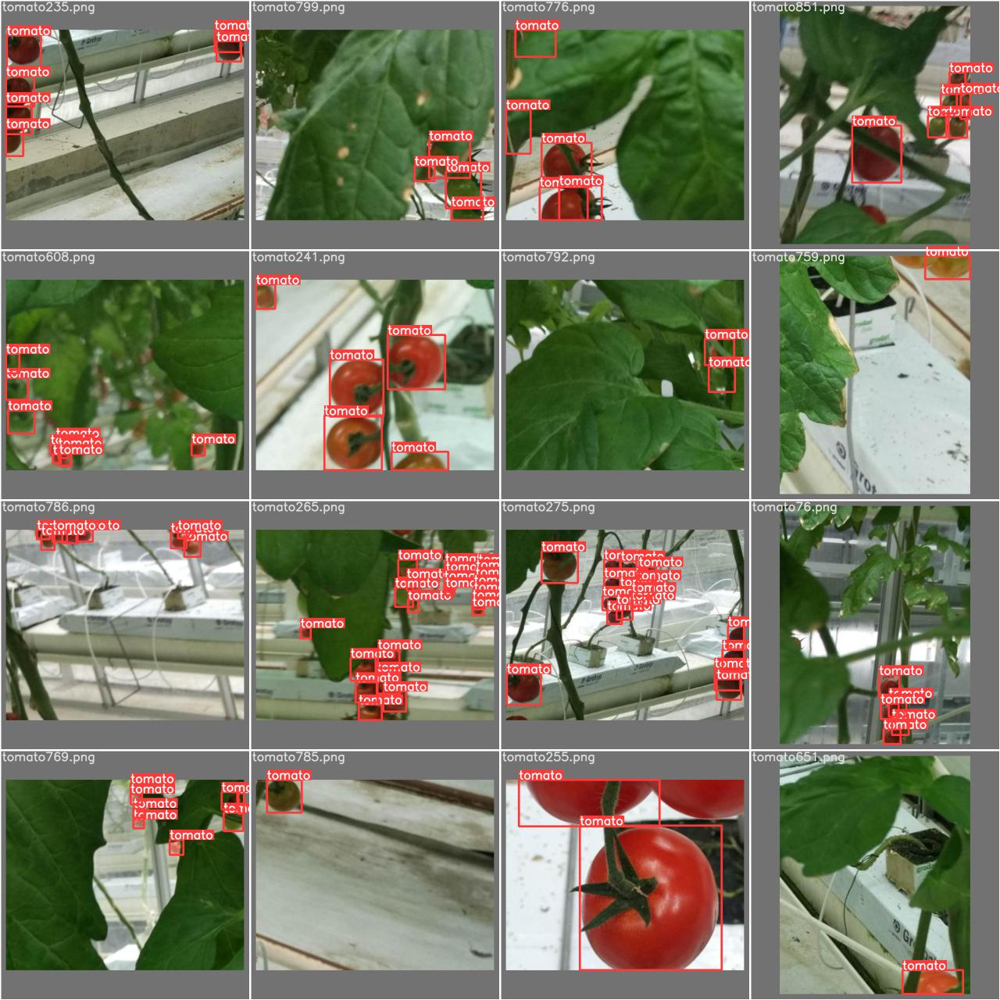

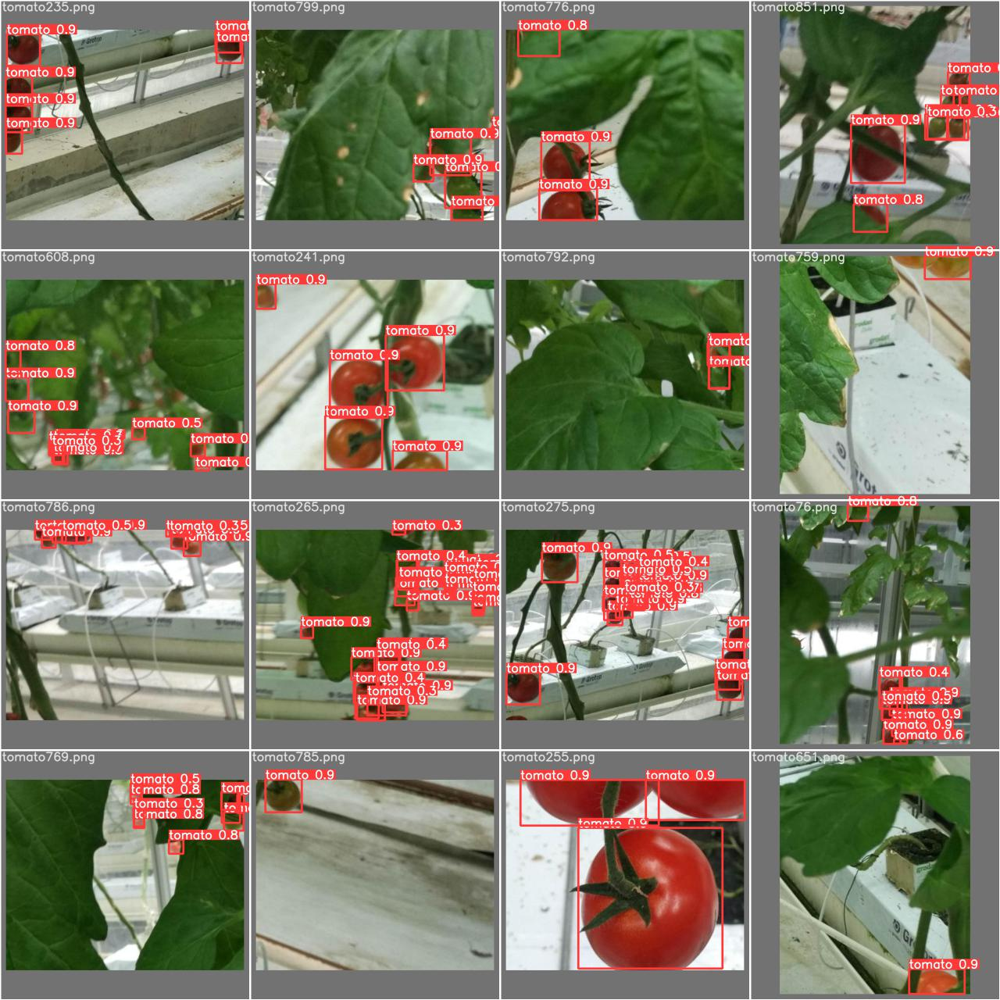

In [ ]:
#display inference on ALL test images
#this looks much better with longer training above

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/drive/MyDrive/Kaggle/Tomato/yolov5/runs/test/exp2/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

Let's run detection on test images
Parameters to consider:

* img-size: define input image size
* conf: Minimum threshold of confidence
* source: Location of the image/video file
* weights: specify our trined weight file
* augment: Augmentation of the images during detection for better result

In [ ]:
!python detect.py --img-size 640  --conf 0.4 --source /content/drive/MyDrive/Kaggle/Tomato/Data/test/images --weights /content/drive/MyDrive/Kaggle/Tomato/yolov5/runs/train/yolov5x_results3/weights/best.pt --augment 

Namespace(agnostic_nms=False, augment=True, classes=None, conf_thres=0.4, device='', exist_ok=False, half=False, hide_conf=False, hide_labels=False, imgsz=640, iou_thres=0.45, line_thickness=3, max_det=1000, name='exp', nosave=False, project='runs/detect', save_conf=False, save_crop=False, save_txt=False, source='/content/drive/MyDrive/Kaggle/Tomato/Data/test/images', update=False, view_img=False, weights=['/content/drive/MyDrive/Kaggle/Tomato/yolov5/runs/train/yolov5x_results3/weights/best.pt'])
YOLOv5 🚀 v5.0-207-g045d5d8 torch 1.9.0+cu102 CUDA:0 (Tesla V100-SXM2-16GB, 16160.5MB)

Fusing layers... 
Model Summary: 476 layers, 87198694 parameters, 0 gradients
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torc

In [ ]:
#display inference on ALL test images
#this looks much better with longer training above

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/drive/MyDrive/Kaggle/Tomato/yolov5/runs/detect/exp5/*.png'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

Copying files: 1790 files [23:26,  1.27 files/s]


In [ ]:
# Data of hyper parameters
!ls ./data

argoverse_hd.yaml     hyp.finetune_objects365.yaml  objects365.yaml  voc.yaml
coco128.yaml	      hyp.finetune.yaml		    scripts
coco.yaml	      hyp.scratch.yaml		    SKU-110K.yaml
GlobalWheat2020.yaml  images			    VisDrone.yaml


In [ ]:
%cat ./data/hyp.finetune.yaml

# Hyperparameters for VOC finetuning
# python train.py --batch 64 --weights yolov5m.pt --data voc.yaml --img 512 --epochs 50
# See tutorials for hyperparameter evolution https://github.com/ultralytics/yolov5#tutorials


# Hyperparameter Evolution Results
# Generations: 306
#                   P         R     mAP.5 mAP.5:.95       box       obj       cls
# Metrics:        0.6     0.936     0.896     0.684    0.0115   0.00805   0.00146

lr0: 0.0032
lrf: 0.12
momentum: 0.843
weight_decay: 0.00036
warmup_epochs: 2.0
warmup_momentum: 0.5
warmup_bias_lr: 0.05
box: 0.0296
cls: 0.243
cls_pw: 0.631
obj: 0.301
obj_pw: 0.911
iou_t: 0.2
anchor_t: 2.91
# anchors: 3.63
fl_gamma: 0.0
hsv_h: 0.0138
hsv_s: 0.664
hsv_v: 0.464
degrees: 0.373
translate: 0.245
scale: 0.898
shear: 0.602
perspective: 0.0
flipud: 0.00856
fliplr: 0.5
mosaic: 1.0
mixup: 0.243


In [ ]:
%%writetemplate ../Data/hyp.custom.yaml

lr0: 0.0032
lrf: 0.12
momentum: 0.843
weight_decay: 0.00036
warmup_epochs: 2.0
warmup_momentum: 0.5
warmup_bias_lr: 0.05
box: 0.0296
cls: 0.243
cls_pw: 0.631
obj: 0.301
obj_pw: 0.911
iou_t: 0.2
anchor_t: 2.91
# anchors: 3.63
fl_gamma: 0.0
hsv_h: 0.0138
hsv_s: 0.664
hsv_v: 0.464
degrees: 0.373
translate: 0.245
scale: 0.898
shear: 0.602
perspective: 0.0
flipud: 0.00856
fliplr: 0.5
mosaic: 1.0
mixup: 0.243

Initialize the weights of previously trained model.

In [ ]:
# %%time
# !python train.py --img 640  --batch 4 --epochs 50 --data /content/drive/MyDrive/Kaggle/Tomato/Data/data.yaml --cfg /content/drive/MyDrive/Kaggle/Tomato/yolov5/models/yolov5x.yaml --weight yolov5x.pt --name yolov5x_results

In [ ]:
%%time
!python train.py --img 640  --batch 4 --epochs 50 --data ../Data/data.yaml --cfg /models/yolov5x.yaml --hyp ../Data/hyp.custom.yaml  --weights /content/drive/MyDrive/Kaggle/Tomato/yolov5/runs/train/yolov5x_results3/weights/best.pt  --name FineTuned

github: ⚠️ WARNING: code is out of date by 4 commits. Use 'git pull' to update or 'git clone https://github.com/ultralytics/yolov5' to download latest.
YOLOv5 🚀 v5.0-207-g045d5d8 torch 1.9.0+cu102 CUDA:0 (Tesla V100-SXM2-16GB, 16160.5MB)

Namespace(adam=False, artifact_alias='latest', batch_size=4, bbox_interval=-1, bucket='', cache_images=False, cfg='./models/yolov5x.yaml', data='../Data/data.yaml', device='', entity=None, epochs=50, evolve=False, exist_ok=False, global_rank=-1, hyp='../Data/hyp.custom.yaml', image_weights=False, img_size=[640, 640], label_smoothing=0.0, linear_lr=False, local_rank=-1, multi_scale=False, name='FineTuned', noautoanchor=False, nosave=False, notest=False, project='runs/train', quad=False, rect=False, resume=False, save_dir='runs/train/FineTuned2', save_period=-1, single_cls=False, sync_bn=False, total_batch_size=4, upload_dataset=False, weights='/content/drive/MyDrive/Kaggle/Tomato/yolov5/runs/train/yolov5x_results3/weights/best.pt', workers=8, world_siz

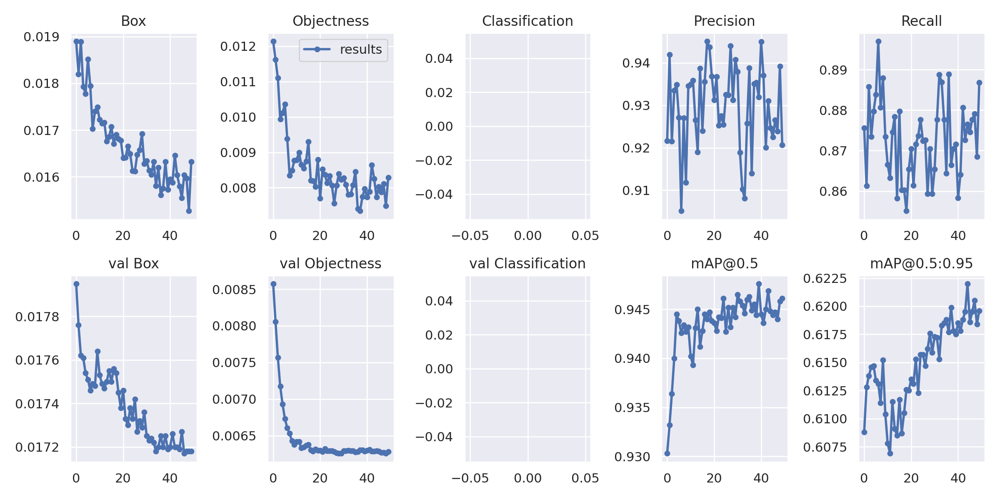

In [ ]:
# Analize the training and validation result
Image('/content/drive/MyDrive/Kaggle/Tomato/yolov5/runs/train/yolov5x_results3/results.png')

In [ ]:
#YOLOv5s
!python test.py --weights ./runs/train/yolov5s_results2/weights/best.pt --data '/content/drive/MyDrive/Kaggle/Tomato/Data/data.yaml' --img 640 --augment

Namespace(augment=True, batch_size=32, conf_thres=0.001, data='/content/drive/MyDrive/Kaggle/Tomato/Data/data.yaml', device='', exist_ok=False, half=False, imgsz=640, iou_thres=0.6, name='exp', project='runs/test', save_conf=False, save_hybrid=False, save_json=False, save_txt=False, single_cls=False, task='val', verbose=False, weights=['./runs/train/yolov5s_results2/weights/best.pt'])
YOLOv5 🚀 2021-6-17 torch 1.9.0+cu102 CUDA:0 (Tesla V100-SXM2-16GB, 16160.5MB)

Fusing layers... 
Model Summary: 224 layers, 7053910 parameters, 0 gradients
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
val: Scanning '/content/drive/MyDrive/Kaggle/Tomato/

In [ ]:
!python detect.py --img-size 640  --conf 0.4 --source ../Data/test/images --weights ./runs/train/yolov5s_results2/weights/best.pt --augment 

Namespace(agnostic_nms=False, augment=True, classes=None, conf_thres=0.4, device='', exist_ok=False, half=False, hide_conf=False, hide_labels=False, imgsz=640, iou_thres=0.45, line_thickness=3, max_det=1000, name='exp', nosave=False, project='runs/detect', save_conf=False, save_crop=False, save_txt=False, source='../Data/test/images', update=False, view_img=False, weights=['./runs/train/yolov5s_results2/weights/best.pt'])
YOLOv5 🚀 v5.0-207-g045d5d8 torch 1.9.0+cu102 CUDA:0 (Tesla V100-SXM2-16GB, 16160.5MB)

Fusing layers... 
Model Summary: 224 layers, 7053910 parameters, 0 gradients
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
image 

In [ ]:
#YOLOv5m
!python test.py --weights ./runs/train/yolov5m_results2/weights/best.pt --data '/content/drive/MyDrive/Kaggle/Tomato/Data/data.yaml' --img 640 --augment

Namespace(augment=True, batch_size=32, conf_thres=0.001, data='/content/drive/MyDrive/Kaggle/Tomato/Data/data.yaml', device='', exist_ok=False, half=False, imgsz=640, iou_thres=0.6, name='exp', project='runs/test', save_conf=False, save_hybrid=False, save_json=False, save_txt=False, single_cls=False, task='val', verbose=False, weights=['./runs/train/yolov5m_results2/weights/best.pt'])
YOLOv5 🚀 v5.0-207-g045d5d8 torch 1.9.0+cu102 CUDA:0 (Tesla V100-SXM2-16GB, 16160.5MB)

Fusing layers... 
Model Summary: 308 layers, 21037638 parameters, 0 gradients
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
val: Scanning '/content/drive/MyDrive/Kaggl

In [ ]:
!python detect.py --img-size 640  --conf 0.4 --source ../Data/test/images --weights ./runs/train/yolov5m_results2/weights/best.pt --augment 

Namespace(agnostic_nms=False, augment=True, classes=None, conf_thres=0.4, device='', exist_ok=False, half=False, hide_conf=False, hide_labels=False, imgsz=640, iou_thres=0.45, line_thickness=3, max_det=1000, name='exp', nosave=False, project='runs/detect', save_conf=False, save_crop=False, save_txt=False, source='../Data/test/images', update=False, view_img=False, weights=['./runs/train/yolov5m_results2/weights/best.pt'])
YOLOv5 🚀 v5.0-207-g045d5d8 torch 1.9.0+cu102 CUDA:0 (Tesla V100-SXM2-16GB, 16160.5MB)

Fusing layers... 
Model Summary: 308 layers, 21037638 parameters, 0 gradients
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
image

In [ ]:
#YOLOv5l
!python test.py --weights ./runs/train/yolov5l_results/weights/best.pt --data '/content/drive/MyDrive/Kaggle/Tomato/Data/data.yaml' --img 640 --augment

Namespace(augment=True, batch_size=32, conf_thres=0.001, data='/content/drive/MyDrive/Kaggle/Tomato/Data/data.yaml', device='', exist_ok=False, half=False, imgsz=640, iou_thres=0.6, name='exp', project='runs/test', save_conf=False, save_hybrid=False, save_json=False, save_txt=False, single_cls=False, task='val', verbose=False, weights=['./runs/train/yolov5l_results/weights/best.pt'])
YOLOv5 🚀 2021-6-17 torch 1.9.0+cu102 CUDA:0 (Tesla V100-SXM2-16GB, 16160.5MB)

Fusing layers... 
Model Summary: 392 layers, 46600566 parameters, 0 gradients
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
val: Scanning '/content/drive/MyDrive/Kaggle/Tomato/

In [ ]:
!python detect.py --img-size 640  --conf 0.4 --source ../Data/test/images --weights ./runs/train/yolov5l_results/weights/best.pt --augment 

Namespace(agnostic_nms=False, augment=True, classes=None, conf_thres=0.4, device='', exist_ok=False, half=False, hide_conf=False, hide_labels=False, imgsz=640, iou_thres=0.45, line_thickness=3, max_det=1000, name='exp', nosave=False, project='runs/detect', save_conf=False, save_crop=False, save_txt=False, source='../Data/test/images', update=False, view_img=False, weights=['./runs/train/yolov5l_results/weights/best.pt'])
YOLOv5 🚀 2021-6-17 torch 1.9.0+cu102 CUDA:0 (Tesla V100-SXM2-16GB, 16160.5MB)

Fusing layers... 
Model Summary: 392 layers, 46600566 parameters, 0 gradients
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
image 1/90 /co

In [ ]:
#YOLOv5x
!python test.py --weights ./runs/train/yolov5x_results3/weights/best.pt --data '/content/drive/MyDrive/Kaggle/Tomato/Data/data.yaml' --img 640 --augment

Namespace(augment=True, batch_size=32, conf_thres=0.001, data='/content/drive/MyDrive/Kaggle/Tomato/Data/data.yaml', device='', exist_ok=False, half=False, imgsz=640, iou_thres=0.6, name='exp', project='runs/test', save_conf=False, save_hybrid=False, save_json=False, save_txt=False, single_cls=False, task='val', verbose=False, weights=['./runs/train/yolov5x_results3/weights/best.pt'])
YOLOv5 🚀 v5.0-207-g045d5d8 torch 1.9.0+cu102 CUDA:0 (Tesla V100-SXM2-16GB, 16160.5MB)

Fusing layers... 
Model Summary: 476 layers, 87198694 parameters, 0 gradients
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
val: Scanning '/content/drive/MyDrive/Kaggl

In [ ]:
!python detect.py --img-size 640  --conf 0.4 --source ../Data/test/images --weights ./runs/train/yolov5x_results3/weights/best.pt --augment 

Namespace(agnostic_nms=False, augment=True, classes=None, conf_thres=0.4, device='', exist_ok=False, half=False, hide_conf=False, hide_labels=False, imgsz=640, iou_thres=0.45, line_thickness=3, max_det=1000, name='exp', nosave=False, project='runs/detect', save_conf=False, save_crop=False, save_txt=False, source='../Data/test/images', update=False, view_img=False, weights=['./runs/train/yolov5x_results3/weights/best.pt'])
YOLOv5 🚀 2021-6-17 torch 1.9.0+cu102 CUDA:0 (Tesla V100-SXM2-16GB, 16160.5MB)

Fusing layers... 
Model Summary: 476 layers, 87198694 parameters, 0 gradients
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
image 1/90 /c

In [ ]:
#YOLOv5x-FineTuned
!python test.py --weights ./runs/train/FineTuned2/weights/best.pt --data '/content/drive/MyDrive/Kaggle/Tomato/Data/data.yaml' --img 640 --augment

Namespace(augment=True, batch_size=32, conf_thres=0.001, data='/content/drive/MyDrive/Kaggle/Tomato/Data/data.yaml', device='', exist_ok=False, half=False, imgsz=640, iou_thres=0.6, name='exp', project='runs/test', save_conf=False, save_hybrid=False, save_json=False, save_txt=False, single_cls=False, task='val', verbose=False, weights=['./runs/train/FineTuned2/weights/best.pt'])
requirements: PyYAML>=5.3.1 not found and is required by YOLOv5, attempting auto-update...
  Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13

requirements: 1 package updated per /content/drive/My Drive/Kaggle/Tomato/yolov5/requirements.txt
requirements: ⚠️ Restart runtime or rerun command for updates to take effect

YOLOv5 🚀 2021-6-17 torch 1.9.0+cu102 CUDA:0 (Tesla P100-PCIE-16GB, 16280.875MB)

Fusing layers... 
Model Summary: 476 layers, 87198694 parameters, 0 gradients
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarn

In [ ]:
!python detect.py --img-size 640  --conf 0.4 --source ../Data/test/images --weights ./runs/train/FineTuned2//weights/best.pt --augment 

Namespace(agnostic_nms=False, augment=True, classes=None, conf_thres=0.4, device='', exist_ok=False, half=False, hide_conf=False, hide_labels=False, imgsz=640, iou_thres=0.45, line_thickness=3, max_det=1000, name='exp', nosave=False, project='runs/detect', save_conf=False, save_crop=False, save_txt=False, source='../Data/test/images', update=False, view_img=False, weights=['./runs/train/FineTuned2//weights/best.pt'])
YOLOv5 🚀 2021-6-17 torch 1.9.0+cu102 CUDA:0 (Tesla V100-SXM2-16GB, 16160.5MB)

Fusing layers... 
Model Summary: 476 layers, 87198694 parameters, 0 gradients
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
image 1/90 /conten